In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
df=pd.read_csv("Telco Customer Churn.csv")

<h1>Exploratory Data Analysis and Data Preprocessing Starts</h1>

<h2>Step 1: Data Understanding Step</h2>

In [4]:
df.shape

(7043, 21)

<b>Inference:</B>
    
From the above output we found that there are 7043 rows and 21 columns.

In [5]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.5,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [6]:
df.tail()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
7038,6840-RESVB,Male,0,Yes,Yes,24,Yes,Yes,DSL,Yes,...,Yes,Yes,Yes,Yes,One year,Yes,Mailed check,84.80,1990.5,No
7039,2234-XADUH,Female,0,Yes,Yes,72,Yes,Yes,Fiber optic,No,...,Yes,No,Yes,Yes,One year,Yes,Credit card (automatic),103.20,7362.9,No
7040,4801-JZAZL,Female,0,Yes,Yes,11,No,No phone service,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.60,346.45,No
7041,8361-LTMKD,Male,1,Yes,No,4,Yes,Yes,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Mailed check,74.40,306.6,Yes
7042,3186-AJIEK,Male,0,No,No,66,Yes,No,Fiber optic,Yes,...,Yes,Yes,Yes,Yes,Two year,Yes,Bank transfer (automatic),105.65,6844.5,No


In [7]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

<h2>Inference:</h2>
    
The column names of the data are as follows: ['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn']

In [8]:
df.dtypes

customerID           object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
dtype: object

<H2>Inference:</H2>

The columns named as SeniorCitizen, Tenure, MonthlyCharges are numerical data type and remaining are categorical data type.
    
Since we know that TotalCharges and SeniorCitizen must be numerical and categorical data types but their data types are wrongly given so we have to change their data type.

In [9]:
df['TotalCharges']=pd.to_numeric(df.TotalCharges,errors='coerce')

In [10]:
custom_categories={0:'No',1:'Yes'}
df['SeniorCitizen']=df['SeniorCitizen'].map(custom_categories)

In [11]:
df.dtypes

customerID           object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
tenure                int64
PhoneService         object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
dtype: object

In [12]:
df.describe()

,tenure,MonthlyCharges,TotalCharges
count,7043.000000,7043.000000,7032.000000
mean,32.371149,64.761692,2283.300441
std,24.559481,30.090047,2266.771362
min,0.000000,18.250000,18.800000
25%,9.000000,35.500000,401.450000
50%,29.000000,70.350000,1397.475000
75%,55.000000,89.850000,3794.737500
max,72.000000,118.750000,8684.800000


<h2>Inference:</h2>
    
It gives us descriptive statistical values like frequency of data for each numerical column such as mean, standard deviation, minimum-maximum value, 1st quartile, 2nd quratile and 3rd quartile for all the numerical columns.

In [13]:
df.describe(include='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
customerID,7043,7043,7590-VHVEG,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,7043,2,Male,3555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SeniorCitizen,7043,2,No,5901,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Partner,7043,2,No,3641,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Dependents,7043,2,No,4933,NaN,NaN,NaN,NaN,NaN,NaN,NaN
tenure,7043.0,NaN,NaN,NaN,32.371149,24.559481,0.0,9.0,29.0,55.0,72.0
PhoneService,7043,2,Yes,6361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MultipleLines,7043,3,No,3390,NaN,NaN,NaN,NaN,NaN,NaN,NaN
InternetService,7043,3,Fiber optic,3096,NaN,NaN,NaN,NaN,NaN,NaN,NaN
OnlineSecurity,7043,3,No,3498,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<h2>Inference:</h2>
    
It gives us descriptive statistical values like frequency of data for each all the feature column such as mean, standard deviation, minimum-maximum value, 1st quartile, 2nd quratile and 3rd quartile for all the numerical columns. And for categorical columns, where some of these statistical value do not hold any significance, they output as NaN.

In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   SeniorCitizen     7043 non-null   object 
 3   Partner           7043 non-null   object 
 4   Dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   PhoneService      7043 non-null   object 
 7   MultipleLines     7043 non-null   object 
 8   InternetService   7043 non-null   object 
 9   OnlineSecurity    7043 non-null   object 
 10  OnlineBackup      7043 non-null   object 
 11  DeviceProtection  7043 non-null   object 
 12  TechSupport       7043 non-null   object 
 13  StreamingTV       7043 non-null   object 
 14  StreamingMovies   7043 non-null   object 
 15  Contract          7043 non-null   object 
 16  PaperlessBilling  7043 non-null   object 


<H2>Checking For Unique Values</H2>

In [15]:
df.nunique()

customerID          7043
gender                 2
SeniorCitizen          2
Partner                2
Dependents             2
tenure                73
PhoneService           2
MultipleLines          3
InternetService        3
OnlineSecurity         3
OnlineBackup           3
DeviceProtection       3
TechSupport            3
StreamingTV            3
StreamingMovies        3
Contract               3
PaperlessBilling       2
PaymentMethod          4
MonthlyCharges      1585
TotalCharges        6530
Churn                  2
dtype: int64

<h2>Inference:</h2>

The above output gives us number of unique values present in each of the feature columns. For example the number of unique values present in Gender feature column is 2 where as that in tenure is 73.

<h2>Step 2: Data Preparation Step</h2>

<h3>1. Detection of Duplicates in Dataset</h3>

In [16]:
df.duplicated().sum()

0

<h2>Inference:</h2>
    
The above output tells us that our dataset contains zero duplicate values, that is our dataset is free of duplicated values.

<h3>2. Detection of Missing values in Dataset</h3>

In [17]:
df.isnull().sum()

customerID           0
gender               0
SeniorCitizen        0
Partner              0
Dependents           0
tenure               0
PhoneService         0
MultipleLines        0
InternetService      0
OnlineSecurity       0
OnlineBackup         0
DeviceProtection     0
TechSupport          0
StreamingTV          0
StreamingMovies      0
Contract             0
PaperlessBilling     0
PaymentMethod        0
MonthlyCharges       0
TotalCharges        11
Churn                0
dtype: int64

<h2>Inference:</h2>
    
The above output tells us that our dataset contains 11 missing values in TotalCharges column, that is our dataset is free of missing values.

<h2>Dealing With These Missing Values</h2>

We will fill the missing values in TotalCharges column using mean imputation method, where we take the mean of total charges column and replace the missing value with that mean value.

In [18]:
df.fillna(df['TotalCharges'].mean(),inplace=True)

In [19]:
df.isnull().sum()

customerID          0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
tenure              0
PhoneService        0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
dtype: int64

<h2>Inference:</h2>
    
The above output we can say that mean imputation has worked properly and the missing values in TotalCharges column has been replaced with mean value of TotalCharges Column.

<B>Note:</B> There are some row values in Tenure column which has zero values which is not possible so we need to drop those rows.

In [20]:
df[df['tenure']==0].index

Int64Index([488, 753, 936, 1082, 1340, 3331, 3826, 4380, 5218, 6670, 6754], dtype='int64')

In [21]:
df.drop(df[df['tenure']==0].index,axis=0,inplace=True)

In [22]:
df[df['tenure']==0].index

Int64Index([], dtype='int64')

<h3>3. Detection of Balanaced or Imbalanced Dataset</h3>

In [23]:
df['Churn'].value_counts()

No     5163
Yes    1869
Name: Churn, dtype: int64

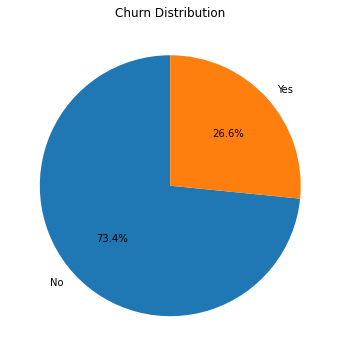

In [24]:
churn_counts = df['Churn'].value_counts()
labels = churn_counts.index
sizes = churn_counts.values

plt.figure(figsize=(10,6))
plt.pie(sizes, labels=labels, startangle=90, autopct='%1.1f%%')
plt.title('Churn Distribution');

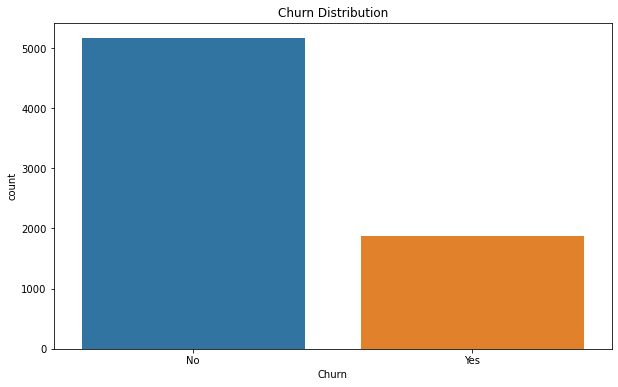

In [25]:
plt.figure(figsize=(10,6))
sns.countplot(df['Churn'])
plt.title('Churn Distribution');

<H2>Inference:</H2>
    
From the above Pie-Chart and Countplot we found that our dataset is not imbalanced.

<h3>4. Detection of Outliers</h3>

In [26]:
df_num=df.select_dtypes(exclude='object')

In [27]:
df_num.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

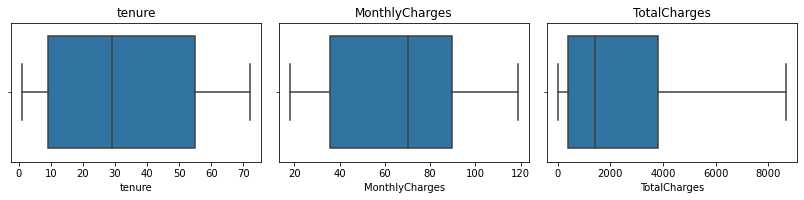

In [28]:
feat = df_num.columns

plt.figure(figsize=(15, 10))  
for i, feature in enumerate(feat):
    plt.subplot(4, 4, i + 1)  
    sns.boxplot(data=df, x=feature)
    plt.title(feature)
    
plt.tight_layout()
plt.show()

<H2>Inference:</H2>
    
From the above boxplot we found that there are no outliers present in our dataset.

<H1>Step 4: Feature Understanding Step</H1>

<H1>1. Univariate Analysis Starts</H1>

<H2>Count Plots for All Categorical Columns</H2>

In [29]:
df_cat=df.select_dtypes(include='object')

In [30]:
df_cat.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'PhoneService', 'MultipleLines', 'InternetService', 'OnlineSecurity',
       'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV',
       'StreamingMovies', 'Contract', 'PaperlessBilling', 'PaymentMethod',
       'Churn'],
      dtype='object')

In [31]:
df_cat=df_cat.drop('customerID',axis=1)

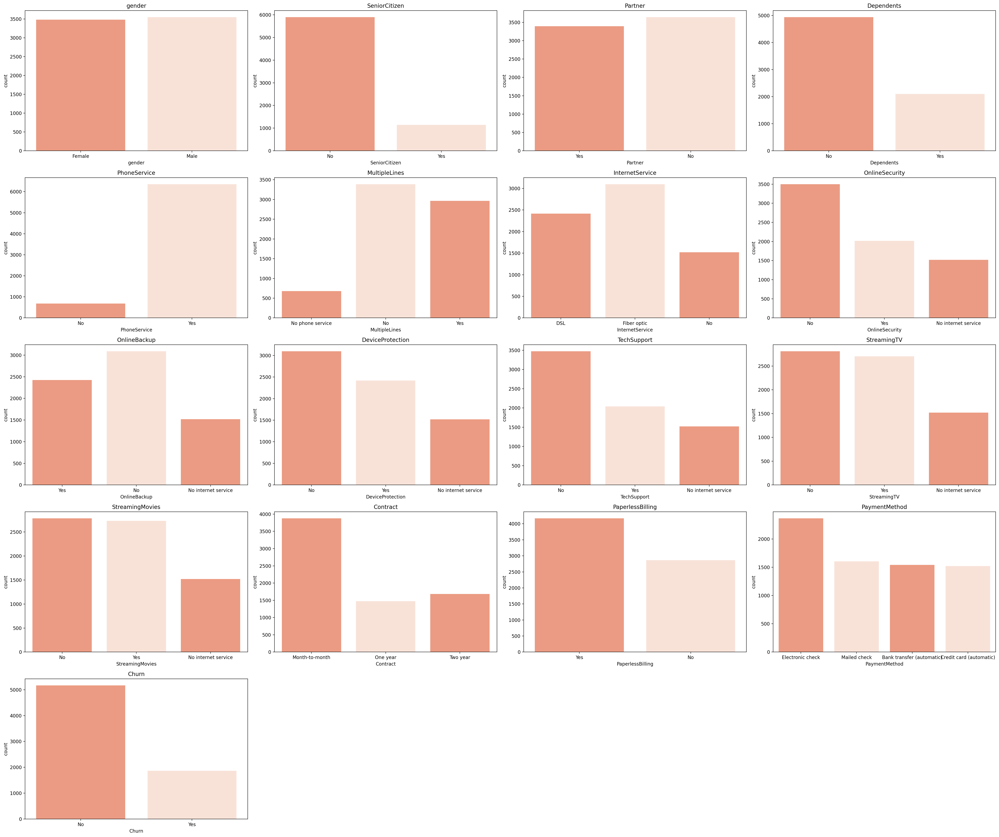

In [32]:
feat = df_cat.columns

plt.figure(figsize=(30,25),dpi=200)  
for i, feature in enumerate(feat):
    plt.subplot(5, 4, i + 1)
    sns.countplot(data=df, x=feature,palette=["#fc9272","#fee0d2"])
    plt.title(feature)
    
plt.tight_layout()  
plt.show();

<h2>Inference:</h2>

From the above count plots we can notice the distribution of each and every categorical column in our dataset clearly. The notable points that we can infer are as follows:

1. The Number of males and females in our dataset is nearly same.
2. Our dataset contains more young people then senior citizen people.
3. The people who are single is slightly higher than the number of people who are having partner.
4. Their are more people who do not have dependents as compared to people who have.
5. The people who have phone service are higher in number than people who do not have it, in our dataset.
6. The people who are having no multiple lines are highest, then comes the people who have and at last comes the people who do not have phone service.
7. The people who are having fiber optic are as internet service are highest, then comes people who have DSL as the internet service and at last comes the people who are not having any internet services.
8. The people who are having no online security are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
9. The people who are having no online backup are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
10. The people who are having no Device Protection are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
11. The people who are having no Tech Support are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
12. The people who are having no Streaming TV are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
13. The people who are having no Streaming Movies are highest, then comes the people who have it and at last comes the people who are not having internet services at all.
14. The people with Month-to-Month contract are highest in number, then comes the people with  two year contract and at last comes those people who are having one year contract.
15. The people prefer more paperless billing as compared to non-paperless billing method in our dataset.
16. The most prefered payment method is electronic check and it decreases in the following order: electronic check>Mailed Check> Bank Transfer>Credit Card.

<H2>Displots for All Numerical Columns</H2>

<Figure size 4000x4000 with 0 Axes>

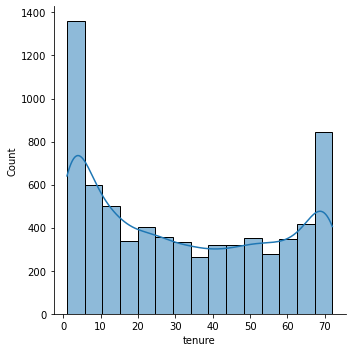

In [33]:
plt.figure(figsize=(20,20),dpi=200)
sns.displot(data=df,x='tenure',kde=True)

<h2>Inference:</h2>
    
The above displot for tenure shows that people prefer month to month tenure more or the tenure which are longer, but tenure which are in the mid range are less prefered by people.

<Figure size 4000x4000 with 0 Axes>

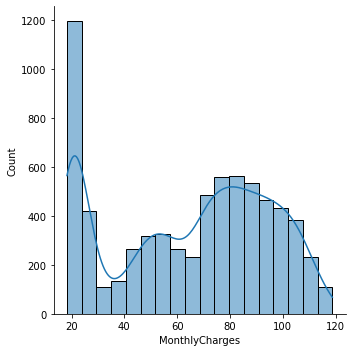

In [34]:
plt.figure(figsize=(20,20),dpi=200)
sns.displot(data=df,x='MonthlyCharges',kde=True)

<h2>Inference:</h2>
    
The above displot for Monthly Charges shows that people are either having monthly charges which are in range 20 to 30, or in the range 65 to 100.

<Figure size 4000x4000 with 0 Axes>

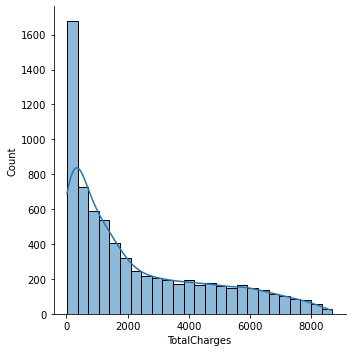

In [35]:
plt.figure(figsize=(20,20),dpi=200)
sns.displot(data=df,x='TotalCharges',kde=True)

<h2>Inference:</h2>
    
The above displot for Total Charges shows that most people are having total charges which are in range 0 to 2000, and the graph of total charges is right skewed.

<h2>Normality Check For All Numerical Variables</h2>

In [36]:
from scipy.stats import norm

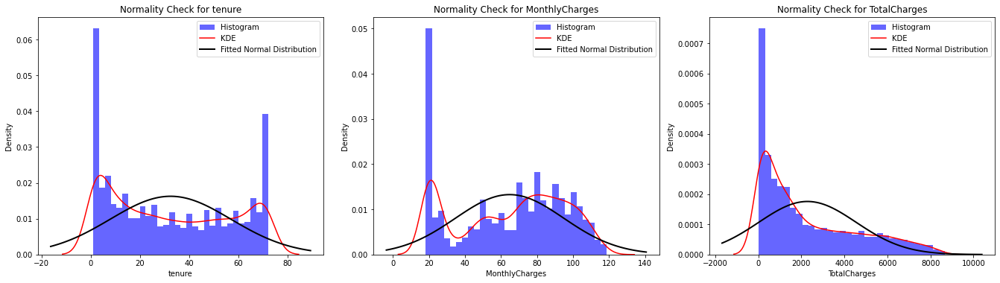

In [37]:
feat = ['tenure', 'MonthlyCharges', 'TotalCharges']

plt.figure(figsize=(25, 20))
for i, feature in enumerate(feat):
    plt.subplot(4, 4, i + 1)
    plt.hist(df[feature], bins=30, density=True, alpha=0.6, color='b', label='Histogram',)
    sns.kdeplot(df[feature], color='r', label='KDE')
    plt.title(feature)
    plt.xlabel(feature)
    
    mu, std = norm.fit(df[feature])
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    
    plt.plot(x, p, 'k', linewidth=2, label='Fitted Normal Distribution')
    plt.legend()
    plt.title(f"Normality Check for {feature}")
    
plt.tight_layout()
plt.show()

<h2>Inference:</h2>
    
The above normality plot for each numerical plot shows how much the distribution is similar to the normal distribution or how much it deviates from the normal distribution. The black line is the line which gives the normal distribution curve whereas the red line gives us the curve of the each numerical column. We can easily infer from the above plot how all 3 distribution of each numerical plots is far different from the normal distribution of the curve!

<h1>Bivariate Analysis Starts</h1>

<h2>1. Count Plot between all possible combination of features and labels</h2>

In [38]:
df.columns

Index(['customerID', 'gender', 'SeniorCitizen', 'Partner', 'Dependents',
       'tenure', 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport',
       'StreamingTV', 'StreamingMovies', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn'],
      dtype='object')

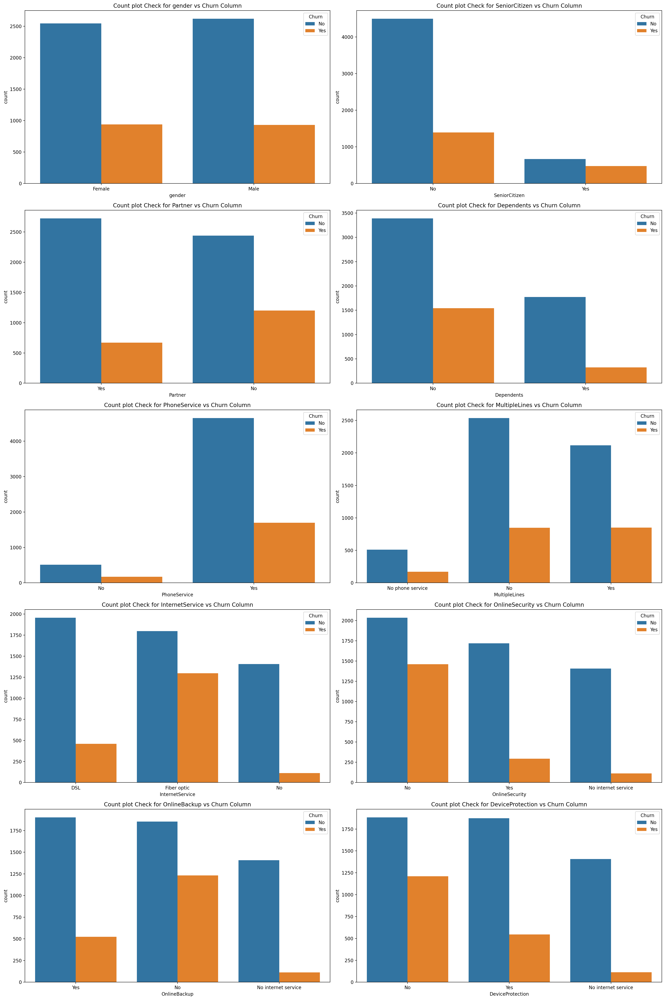

In [42]:
feat = ['gender', 'SeniorCitizen', 'Partner', 'Dependents'
        , 'PhoneService', 'MultipleLines', 'InternetService',
       'OnlineSecurity', 'OnlineBackup','DeviceProtection']

plt.figure(figsize=(20, 30), dpi=200)
for i, feature in enumerate(feat):
    plt.subplot(5,2, i + 1)
    sns.countplot(data=df, x=feature, hue='Churn')
    plt.title(f"Count plot Check for {feature} vs Churn Column")
    
plt.tight_layout()
plt.show()

<h2>Inference:</h2>
    
The above count plots show us the different counts plots for each categorical features with respect to the churn column present in our dataset. The inference which can draw from these plots are listed below:

1. From the gender distribution with respect to chrun column we infer that both males and females are nearly same in number who will churn whereas the number of males is slightly higher than number of females in the dataset who are not churning.
2. From the senior citizen distribution with respect to churn column we can infer that people who are not senior citizen are less likely to not churn or churn where as the people who are senior citizen are less likely to churn or not churn.
3. From the partner distribution with respect to churn column we can infer that the people who are having partner are more likely to not churn as comparison to people who are having partners, whereas the people who are having partners are more likely to churn as comparison to people who are not having partners.
4. From the dependents distribution with respect to churn column, we can infer that people who are not having dependents are more likely to not churn as comparison to people who are not having dependents. And people who are having dependents are less likely to churn as comparison to people who are having no dependents.
5. From the countplot of Phone Service with respect to churn column, we can infer that people who are having phone service are churning or not churning a lot in comparison to people who are not having any phone service, which is a naturally evident phenomenon.
6. From the countplot of MultipleLines with respect to churn column we can easily conclude that who are not having multiple lines are more in number of both churning and not churning, where the people who are having multiple lines comes in second place and last comes the people with no phone service.
7. From the countplot of Internet Service with respect to the churn column we can easily infer that people who are having DSL are in highest number who are not churning then comes people with fiber optic and at last comes people who do not have internet service. Similarly, we can also say that people who are having DSL are least churning in comparison to people who are having fiber optic as internet service.
8. From the countplot of online security with respect to churn column we can infer that people who are not having any online security are more likely to not churn or churn in comparison to people who are not having any online security or people with no online security. 
9. From countplot of online backup we can infer that people with online backup are more likely to not churn in comparison to people who are having any online back up or people with no internet service. Where as people without online backup are more likely to churn in comparison to people with online backup or people with no internet service.
10. From the countplot of Device Protection with respect to churn column we can infer that people who are having device protection and people who are not having them are somewhat same in number who will not churn whereas people who are having device protection are less likely to churn in comparison to people who are not having device protection.

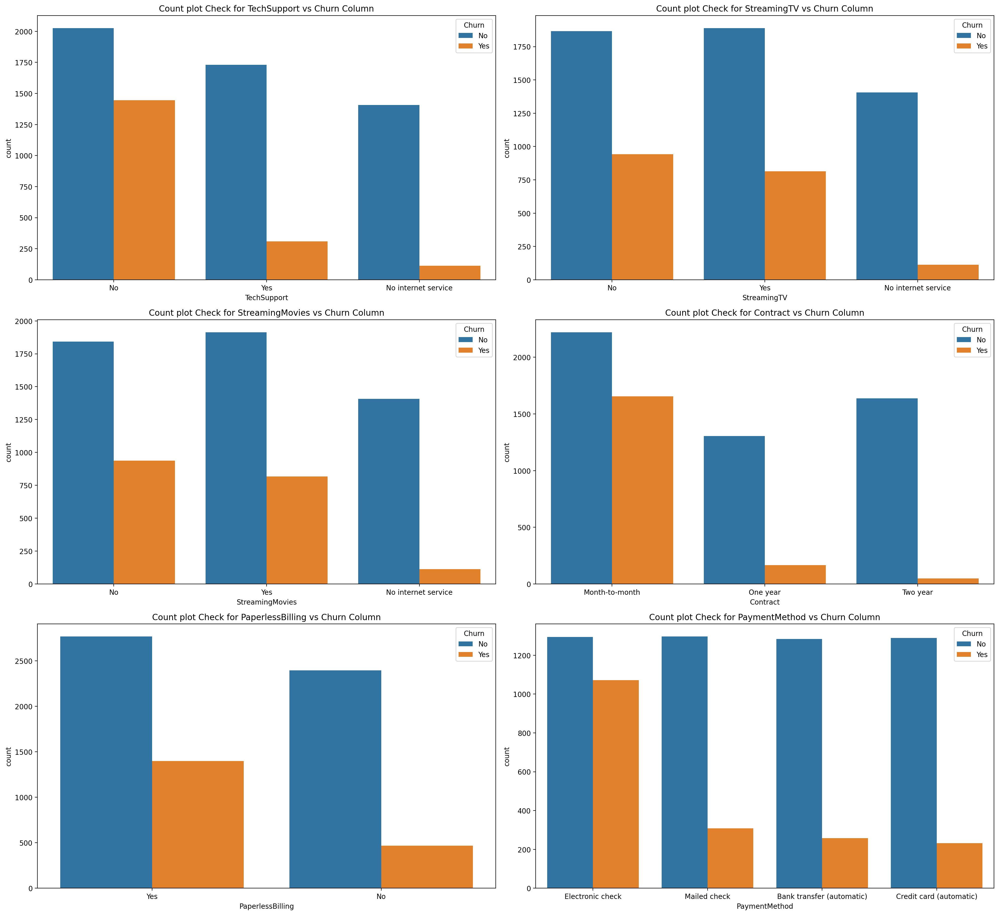

In [41]:
feat =  ['TechSupport',
       'StreamingTV', 'StreamingMovies','Contract', 'PaperlessBilling',
       'PaymentMethod']

plt.figure(figsize=(20,30), dpi=200)
for i, feature in enumerate(feat):
    plt.subplot(5, 2, i + 1)
    sns.countplot(data=df, x=feature, hue='Churn')
    plt.title(f"Count plot Check for {feature} vs Churn Column")
    
plt.tight_layout()
plt.show()

<h2>Inference:</h2>
    
The above count plots show us the different counts plots for each categorical features with respect to the churn column present in our dataset. The inference which can draw from these plots are listed below:

11. From the countplot of TechSupport vs churn column we can easily see that people who are not having tech support are more in number in both classes of churn or not churn in comparison to people who are having tech support or people who do not have any internet service.
12. From the countplot of Streaming TV vs churn column we can easily see that people who are not having Streaming TV are more  in number in both classes of churn or not churn in comparison to people who are having Streaming TV support or people who do not have any internet service.
13. From the countplot of Streaming Movies vs churn column we can easily see that people who are having Streaming TV are more likely to not churn in comparison to people who are not having any streaming movies or people who do not have any internet service. Whereas people are who are not having any streaming movies are more likely to churn in comparison to people who are  having any streaming movies or people who do not have any internet service.
14. From the countplot of Contract vs churn column we can infer that month to month contract are more likely to churn in comparison to people with 1 year or 2 year contract and people with 2 year contract are least likely to churn. Similarly people with month to month contract are more likely to not churn, then comes the people with 2 year contract and at last comes people with 1 year contract.
15. From the countplot of paperless billing to churn column we can easily see that people with paperless billing are higher in number in both category of churn or not churn in comparison to people without paperless billing.
16. From the countplot of Payment method with churn column we can easily infer that people with payment method is not a big influence on deciding people who will not churn where as it is big factor in deciding people who will churn, as people with electronic check are mostly likely to churn then comes people with mailed check and people with bank transfer and credit card are equal in number to churn.

<h2>2. Plots Between Feature Columns</h2>

<h2>A. Plots between Numerical & Numerical Columns</h2>

In [40]:
df_num.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges'], dtype='object')

<AxesSubplot:xlabel='tenure', ylabel='MonthlyCharges'>

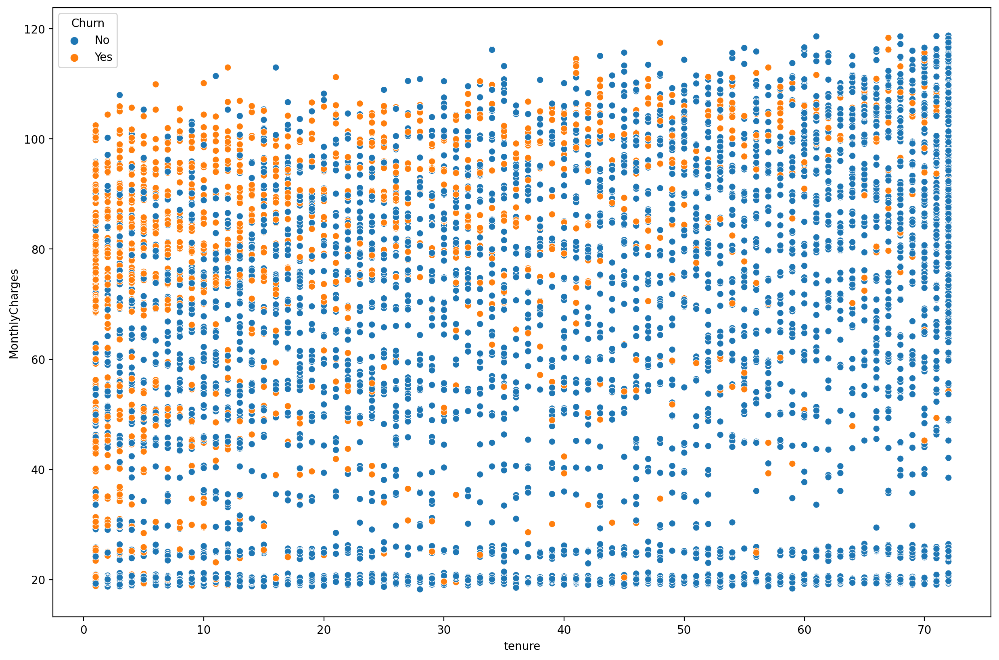

In [41]:
plt.figure(figsize=(15,10),dpi=200)
sns.scatterplot(data=df,x='tenure',y='MonthlyCharges',hue='Churn')

<h2>Inference:</h2>

From the above scatter plot, we can easily see that people who are having less tenure and very high monthly charges are more likely to churn. Whereas if the tenure is high then monthly charges do not play a very significant role in deciding whether the person will churn or not.

<AxesSubplot:xlabel='tenure', ylabel='TotalCharges'>

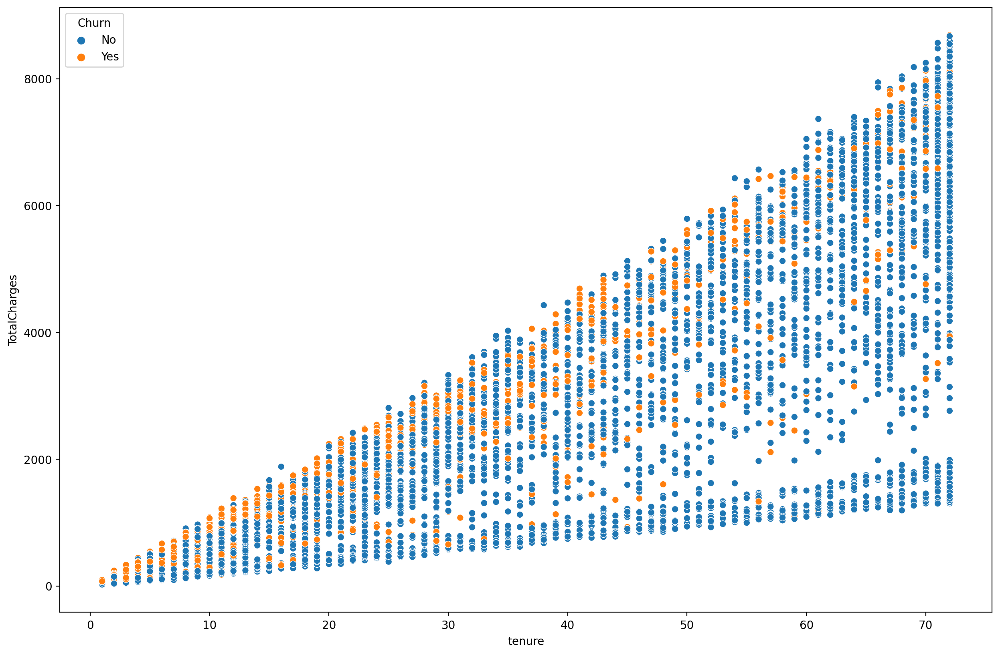

In [42]:
plt.figure(figsize=(15,10),dpi=200)
sns.scatterplot(data=df,x='tenure',y='TotalCharges',hue='Churn')

<h2>Inference:</h2>

From the above scatter plot, we can easily see that people who are having less tenure and high total charges are more likely to churn. Whereas if the tenure is high then total charges do not play a very significant role in deciding whether the person will churn or not.

<AxesSubplot:xlabel='MonthlyCharges', ylabel='TotalCharges'>

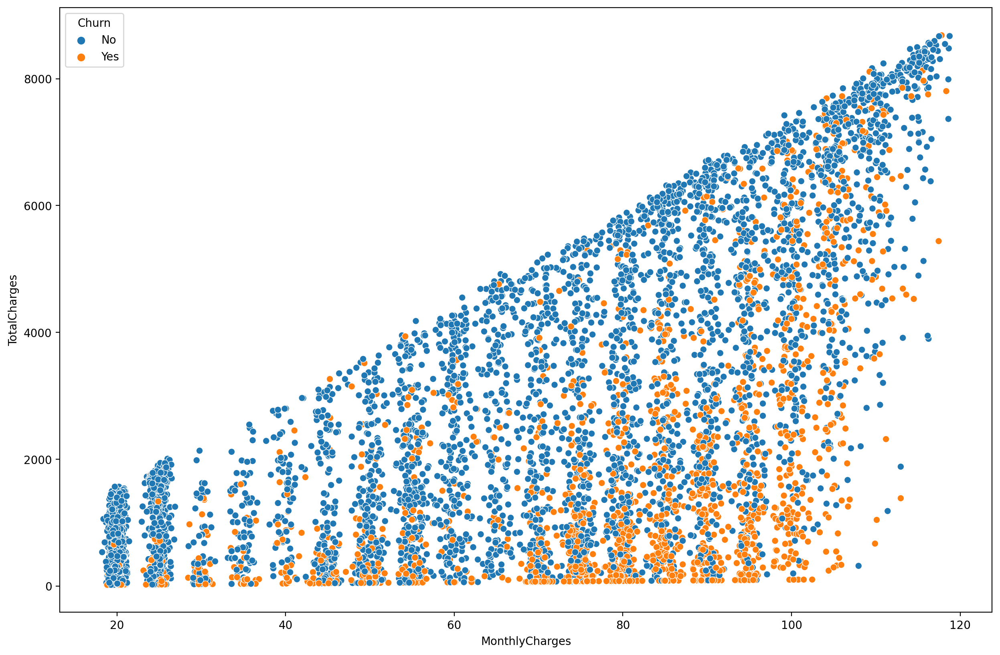

In [43]:
plt.figure(figsize=(15,10),dpi=200)
sns.scatterplot(data=df,x='MonthlyCharges',y='TotalCharges',hue='Churn')

<h2>Inference:</h2>

From the above scatter plot, we can easily see that people who are having very high monthly charges usually in the range of 75 to 110 are more likely to churn even if the total charges value is very low. So, we can even say that montly charges is more influencing factor in comparison to total charges to churning or not churning.

<h2>B. Plots Between Numerical & Categorical Columns</h2>

<h3>1. Box-Plot Between all the Categorical Column And Tenure Numerical Column</h3>

In [45]:
feature=['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
        'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
        'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
        'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']

plt.figure(figsize=(35,50), dpi=300)
for i, feature in enumerate(feature):
    plt.subplot(5,4, i + 1)
    sns.boxplot(data=df, x=feature, y=df['tenure'])
    plt.title(f"Count plot Check for {feature} vs Tenure Column")
    
plt.tight_layout()
plt.show()

<h3>2. Box-Plot Between all the Categorical Column And MonthlyCharges Numerical Column</h3>

In [46]:
feature=['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
        'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
        'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
        'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']

plt.figure(figsize=(35,50), dpi=300)
for i, feature in enumerate(feature):
    plt.subplot(6,3, i + 1)
    sns.boxplot(data=df, x=feature, y=df['MonthlyCharges'])
    plt.title(f"Box plot Check for {feature} vs Monthly Charges Column")
    
plt.tight_layout()
plt.show()

<h3>3. Box-Plot Between all the Categorical Column And TotalCharges Numerical Column</h3>

In [106]:
feature=['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
        'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
        'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
        'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn']

plt.figure(figsize=(35,50), dpi=300)
for i, feature in enumerate(feature):
    plt.subplot(5,4, i + 1)
    sns.boxplot(data=df, x=feature, y=df['TotalCharges'])
    plt.title(f"Count plot Check for {feature} vs Total Charges Column")
    
plt.tight_layout()
plt.show()

<h2>C. Plots Between Categorical-Categorical Columns</h2>

In [107]:
df_cat.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

<h2>1. Gender vs Churn-Target Column Analysis</h2>

In [108]:
contingency_table1 = pd.crosstab(df['gender'], df['Churn'])

In [109]:
contingency_table1

Churn,No,Yes
gender,,
Female,2544,939
Male,2619,930


<h1>Inference:</h1>
    
The above contingency table shows the distribution of Gender on the basis on Churn Label column. We can see that Gender has 2 options namely 'No', and 'Yes' and their distribtuion for whether they will churn or not.

<h2>2. SeniorCitizen vs Churn-Target Column Analysis</h2>

In [110]:
contingency_table2 = pd.crosstab(df['gender'], df['Churn'])

In [111]:
contingency_table2

Churn,No,Yes
gender,,
Female,2544,939
Male,2619,930


<h1>Inference:</h1>
    
The above contingency table shows the distribution of SeniorCitizen on the basis on Churn Label column. We can see that SeniorCitizen has 2 options namely 'No', and 'Yes' and their distribtuion for whether they will churn or not.

<h2>3. Partner vs Churn-Target Column Analysis</h2>

In [112]:
contingency_table3 = pd.crosstab(df['Partner'], df['Churn'])

In [113]:
contingency_table3

Churn,No,Yes
Partner,,
No,2439,1200
Yes,2724,669


<h1>Inference:</h1>
    
The above contingency table shows the distribution of Partner on the basis on Churn Label column. We can see that Partner has 2 options namely 'No', and 'Yes' and their distribtuion for whether they will churn or not.

<h2>4. Dependents vs Churn-Target Column Analysis</h2>

In [114]:
contingency_table4 = pd.crosstab(df['Dependents'], df['Churn'])

In [115]:
contingency_table4

Churn,No,Yes
Dependents,,
No,3390,1543
Yes,1773,326


<h1>Inference:</h1>
    
The above contingency table shows the distribution of Dependents on the basis on Churn Label column. We can see that Dependents has 2 options namely 'No', and 'Yes' and their distribtuion for whether they will churn or not.

<h2>5. PhoneService vs Churn-Target Column Analysis</h2>

In [116]:
contingency_table5 = pd.crosstab(df['PhoneService'], df['Churn'])

In [117]:
contingency_table5

Churn,No,Yes
PhoneService,,
No,510,170
Yes,4653,1699


<h1>Inference:</h1>
    
The above contingency table shows the distribution of PhoneService on the basis on Churn Label column. We can see that PhoneService has 2 options namely 'No', and 'Yes' and their distribtuion for whether they will churn or not.

<h2>6. MultipleLines vs Churn-Target Column Analysis</h2>

In [118]:
contingency_table6 = pd.crosstab(df['MultipleLines'], df['Churn'])

In [119]:
contingency_table6

Churn,No,Yes
MultipleLines,,
No,2536,849
No phone service,510,170
Yes,2117,850


<h1>Inference:</h1>
    
The above contingency table shows the distribution of MultipleLines on the basis on Churn Label column. We can see that MultipleLines has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>7. InternetService vs Churn-Target Column Analysis</h2>

In [120]:
contingency_table7 = pd.crosstab(df['InternetService'], df['Churn'])

In [121]:
contingency_table7

Churn,No,Yes
InternetService,,
DSL,1957,459
Fiber optic,1799,1297
No,1407,113


<h1>Inference:</h1>
    
The above contingency table shows the distribution of InternetService on the basis on Churn Label column. We can see that InternetService has 3 options namely 'DSL','Fiber Optic' and 'No' and their distribtuion for whether they will churn or not.

<h2>8. OnlineSecurity vs Churn-Target Column Analysis</h2>

In [122]:
contingency_table8 = pd.crosstab(df['OnlineSecurity'], df['Churn'])

In [123]:
contingency_table8

Churn,No,Yes
OnlineSecurity,,
No,2036,1461
No internet service,1407,113
Yes,1720,295


<h1>Inference:</h1>
    
The above contingency table shows the distribution of OnlineSecurity on the basis on Churn Label column. We can see that OnlineSecurity has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>9. OnlineBackup vs Churn-Target Column Analysis</h2>

In [124]:
contingency_table9 = pd.crosstab(df['OnlineBackup'], df['Churn'])

In [125]:
contingency_table9

Churn,No,Yes
OnlineBackup,,
No,1854,1233
No internet service,1407,113
Yes,1902,523


<h1>Inference:</h1>
    
The above contingency table shows the distribution of OnlineBackup on the basis on Churn Label column. We can see that OnlineBackup has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>10. DeviceProtection vs Churn-Target Column Analysis</h2>

In [126]:
contingency_table10 = pd.crosstab(df['DeviceProtection'], df['Churn'])

In [127]:
contingency_table10

Churn,No,Yes
DeviceProtection,,
No,1883,1211
No internet service,1407,113
Yes,1873,545


<h1>Inference:</h1>
    
The above contingency table shows the distribution of DeviceProtection on the basis on Churn Label column. We can see that DeviceProtection has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>11. TechSupport vs Churn-Target Column Analysis</h2>

In [128]:
contingency_table11 = pd.crosstab(df['TechSupport'], df['Churn'])

In [129]:
contingency_table11

Churn,No,Yes
TechSupport,,
No,2026,1446
No internet service,1407,113
Yes,1730,310


<h1>Inference:</h1>
    
The above contingency table shows the distribution of TechSupport on the basis on Churn Label column. We can see that TechSupport has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>12. StreamingTV vs Churn-Target Column Analysis</h2>

In [130]:
contingency_table12 = pd.crosstab(df['StreamingTV'], df['Churn'])

In [131]:
contingency_table12

Churn,No,Yes
StreamingTV,,
No,1867,942
No internet service,1407,113
Yes,1889,814


<h1>Inference:</h1>
    
The above contingency table shows the distribution of StreamingTV on the basis on Churn Label column. We can see that StramingTV has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>13. StreamingMovies vs Churn-Target Column Analysis</h2>

In [132]:
contingency_table13 = pd.crosstab(df['StreamingMovies'], df['Churn'])

In [133]:
contingency_table13

Churn,No,Yes
StreamingMovies,,
No,1843,938
No internet service,1407,113
Yes,1913,818


<h1>Inference:</h1>
    
The above contingency table shows the distribution of StreamingMovies on the basis on Churn Label column. We can see that StramingMovies has 3 options namely 'No','No Internet Services' and 'Yes' and their distribtuion for whether they will churn or not.

<h2>14. Contract vs Churn-Target Column Analysis</h2>

In [134]:
contingency_table14 = pd.crosstab(df['Contract'], df['Churn'])

In [135]:
contingency_table14

Churn,No,Yes
Contract,,
Month-to-month,2220,1655
One year,1306,166
Two year,1637,48


<h1>Inference:</h1>
    
The above contingency table shows the distribution of Contract on the basis on Churn Label column. We can see that Contract has 3 options namely Month-To-Month, One Year and Two Year and their distribtuion for whether they will churn or not.

<h2>15. PaperlessBilling vs Churn-Target Column Analysis</h2>

In [136]:
contingency_table15 = pd.crosstab(df['PaperlessBilling'], df['Churn'])

In [137]:
contingency_table15

Churn,No,Yes
PaperlessBilling,,
No,2395,469
Yes,2768,1400


<h1>Inference:</h1>
    
The above contingency table shows the distribution of PaperlessBiling on the basis on Churn Label column. We can see that PaperlessBiling has 2 options namely 'yes' or 'no' and their distribtuion for whether they will churn or not.

<h2>16. PaymentMethod vs Churn-Target Column Analysis</h2>

In [138]:
contingency_table16 = pd.crosstab(df['PaymentMethod'], df['Churn'])

In [139]:
contingency_table16

Churn,No,Yes
PaymentMethod,,
Bank transfer (automatic),1284,258
Credit card (automatic),1289,232
Electronic check,1294,1071
Mailed check,1296,308


<h1>Inference:</h1>
    
The above contingency table shows the distribution of PaymentMethod on the basis on Churn Label column. We can see that PaymentMethod has 4 options namely Bank Transfer, Credit card, electronic check, mailed check and their distribtuion for whether they will churn or not.

<h2>Step 5: Feature Relationship Step</h2>
    
<H2>Multivariate Analysis</H2>
    
<h3>1. Correlation Matrix</h3>

In [140]:
df.corr()

,tenure,MonthlyCharges,TotalCharges
tenure,1.000000,0.246862,0.825880
MonthlyCharges,0.246862,1.000000,0.651065
TotalCharges,0.825880,0.651065,1.000000


<h3>Inference:</h3>
    
We need to do encoding to get correlation values for categorical columns as well.

<h1>Encoding our Categorical Feature and label column</h1>

In [141]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,No,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,No,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


<h2>Encoding Features Using One Hot Encoder</h2>

In [142]:
from sklearn.preprocessing import OneHotEncoder

In [143]:
one_hot=OneHotEncoder(sparse=False)

In [144]:
df_cat.columns

Index(['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
       'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
       'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
       'Contract', 'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

In [145]:
# Specify the columns to one-hot encode
columns_to_encode = ['gender', 'SeniorCitizen', 'Partner', 'Dependents', 'PhoneService',
                     'MultipleLines', 'InternetService', 'OnlineSecurity', 'OnlineBackup',
                     'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies',
                     'Contract', 'PaperlessBilling', 'PaymentMethod']

for feature in columns_to_encode:
    df_cat[feature] = one_hot.fit_transform(np.array(df_cat[feature]).reshape(-1,1))

In [146]:
df_cat

,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,No
1,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,No
2,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes
3,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,No
4,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,No
7039,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,No
7040,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,No
7041,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes


In [147]:
df.head()

,customerID,gender,SeniorCitizen,Partner,Dependents,tenure,PhoneService,MultipleLines,InternetService,OnlineSecurity,...,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn
0,7590-VHVEG,Female,No,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,No,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,No,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,No,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,No,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


In [148]:
df_num

,tenure,MonthlyCharges,TotalCharges
0,1,29.85,29.85
1,34,56.95,1889.50
2,2,53.85,108.15
3,45,42.30,1840.75
4,2,70.70,151.65
...,...,...,...
7038,24,84.80,1990.50
7039,72,103.20,7362.90
7040,11,29.60,346.45
7041,4,74.40,306.60


In [149]:
df_encoded=pd.concat([df_num,df_cat],axis=1)

In [150]:
df_encoded

,tenure,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,1,29.85,29.85,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,No
1,34,56.95,1889.50,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,No
2,2,53.85,108.15,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes
3,45,42.30,1840.75,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,No
4,2,70.70,151.65,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,24,84.80,1990.50,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,No
7039,72,103.20,7362.90,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,No
7040,11,29.60,346.45,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,No
7041,4,74.40,306.60,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Yes


In [151]:
df_encoded.shape

(7032, 20)

<h2>Encoding Label Column Using Label Encoder</h2>

In [152]:
from sklearn.preprocessing import LabelEncoder

In [153]:
label_encoder=LabelEncoder()

In [154]:
df_encoded['Churn']=label_encoder.fit_transform(df_encoded['Churn'])

In [155]:
df_encoded

,tenure,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
0,1,29.85,29.85,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0
1,34,56.95,1889.50,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0
2,2,53.85,108.15,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1
3,45,42.30,1840.75,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0
4,2,70.70,151.65,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,24,84.80,1990.50,1.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0
7039,72,103.20,7362.90,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0
7040,11,29.60,346.45,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0
7041,4,74.40,306.60,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1


In [156]:
df_encoded.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges', 'gender', 'SeniorCitizen',
       'Partner', 'Dependents', 'PhoneService', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies', 'Contract',
       'PaperlessBilling', 'PaymentMethod', 'Churn'],
      dtype='object')

In [157]:
df_encoded.shape

(7032, 20)

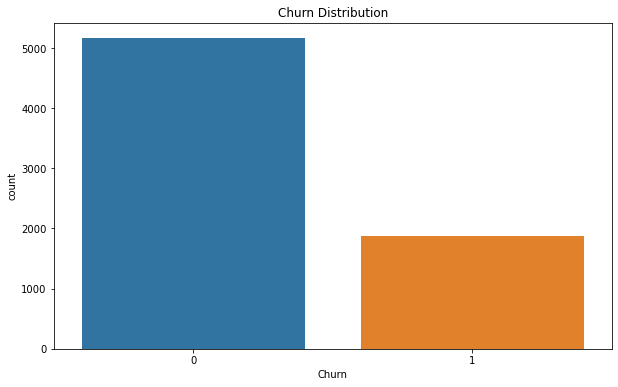

In [158]:
plt.figure(figsize=(10,6))
sns.countplot(df_encoded['Churn'])
plt.title('Churn Distribution');

<h2>Inference:</h2>
    
We have successfully done one hot encoding to all the categorical features and label encoding for the label column present in our dataset. 

Note that 0 is for the value that customer will not churn and 1 is for customer will churn.

<h2>2. Checking Correlations between each Features and Label<h2>

In [159]:
df_encoded.corr()

,tenure,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,PhoneService,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,Contract,PaperlessBilling,PaymentMethod,Churn
tenure,1.000000,0.246862,0.825880,0.005285,-0.005285,0.015683,-0.015683,0.381912,-0.381912,0.163386,-0.163386,0.007877,-0.007877,0.323891,-0.323891,-0.013786,0.013786,0.265987,-0.265987,-0.354049
MonthlyCharges,0.246862,1.000000,0.651065,-0.013779,0.013779,0.219874,-0.219874,0.097825,-0.097825,-0.112343,0.112343,0.248033,-0.248033,0.338514,-0.338514,0.161368,-0.161368,-0.360220,0.360220,0.192858
TotalCharges,0.825880,0.651065,1.000000,0.000048,-0.000048,0.102411,-0.102411,0.319072,-0.319072,0.064653,-0.064653,0.113008,-0.113008,0.396765,-0.396765,0.052190,-0.052190,0.064515,-0.064515,-0.199484
gender,0.005285,-0.013779,0.000048,1.000000,-1.000000,-0.001819,0.001819,-0.001379,0.001379,0.010349,-0.010349,-0.007515,0.007515,-0.004335,0.004335,-0.007584,0.007584,-0.010859,0.010859,-0.008545
SeniorCitizen,-0.005285,0.013779,-0.000048,-1.000000,1.000000,0.001819,-0.001819,0.001379,-0.001379,-0.010349,0.010349,0.007515,-0.007515,0.004335,-0.004335,0.007584,-0.007584,0.010859,-0.010859,0.008545
Partner,0.015683,0.219874,0.102411,-0.001819,0.001819,1.000000,-1.000000,0.016957,-0.016957,-0.210550,0.210550,0.008392,-0.008392,0.136377,-0.136377,0.108276,-0.108276,-0.185145,0.185145,0.150541
Dependents,-0.015683,-0.219874,-0.102411,0.001819,-0.001819,-1.000000,1.000000,-0.016957,0.016957,0.210550,-0.210550,-0.008392,0.008392,-0.136377,0.136377,-0.108276,0.108276,0.185145,-0.185145,-0.150541
PhoneService,0.381912,0.097825,0.319072,-0.001379,0.001379,0.016957,-0.016957,1.000000,-1.000000,0.452269,-0.452269,0.018397,-0.018397,0.130028,-0.130028,0.001043,-0.001043,0.129394,-0.129394,-0.149982
MultipleLines,-0.381912,-0.097825,-0.319072,0.001379,-0.001379,-0.016957,0.016957,-1.000000,1.000000,-0.452269,0.452269,-0.018397,0.018397,-0.130028,0.130028,-0.001043,0.001043,-0.129394,0.129394,0.149982
InternetService,0.163386,-0.112343,0.064653,0.010349,-0.010349,-0.210550,0.210550,0.452269,-0.452269,1.000000,-1.000000,-0.001078,0.001078,-0.023388,0.023388,-0.051593,0.051593,0.186979,-0.186979,-0.163128


<h1>Inference:</h1>
    
The above table shows the pearson's correlation values for all possible combination of feature and feature as well as feature and label column.

<h2>3. Heatmaps:</h2>

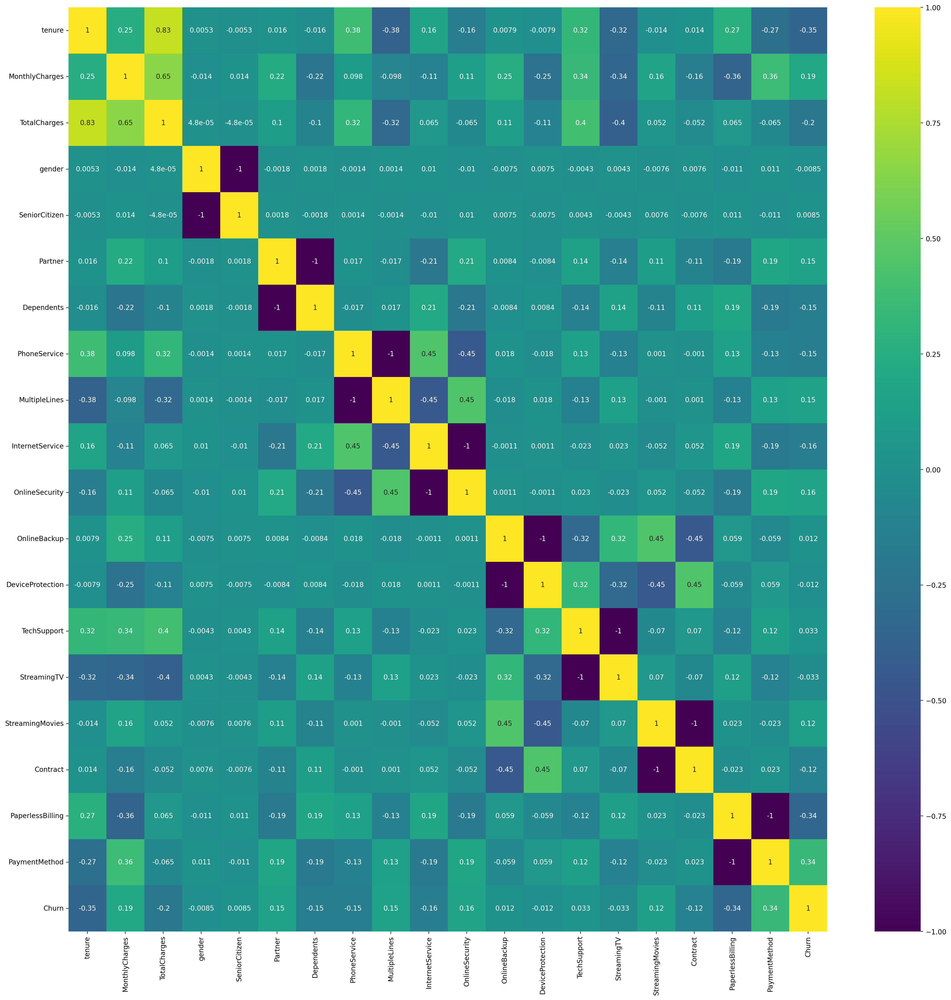

In [160]:
plt.figure(figsize=(25,25),dpi=200)
sns.heatmap(data=df_encoded.corr(),annot=True,cmap='viridis');

<h1>Inference:</h1>
    
From the above heatmap, we can clearly visualize the correlation between each combination of feature and feature, as well as feature and label. And we can see there are darker shades of boxes present for combination of two features like contract and tenure, and so on.

<h2>4. PairPlots </h2>

<Figure size 6000x6000 with 0 Axes>

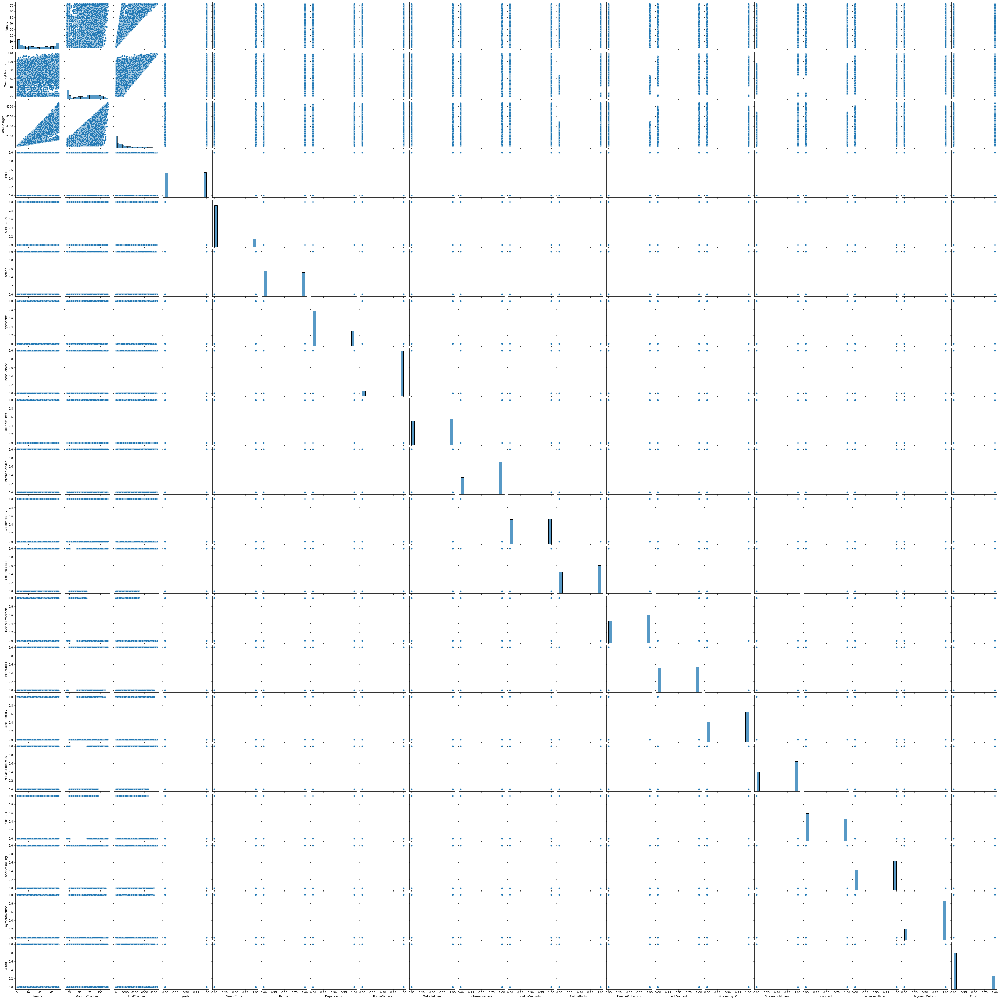

In [161]:
plt.figure(figsize=(30,30),dpi=200)
sns.pairplot(data=df_encoded);

<h2>Inference:</h2>

The above pair plot gives scatter plot every combination of feature and feature as well as feature and label column present in our dataset.

<h2>5. Correlation Plot Between Each Features And Label Only<h2>

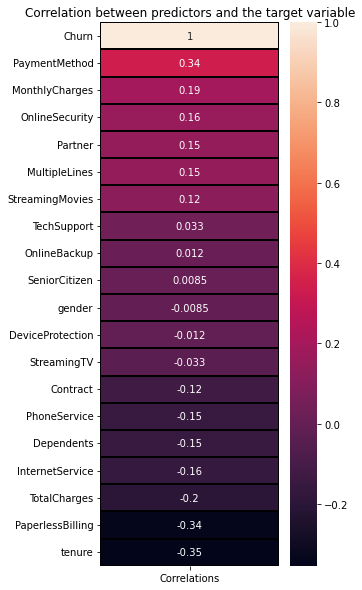

In [162]:
corr = df_encoded.corrwith(df_encoded['Churn']).sort_values(ascending=False).to_frame()
corr.columns = ['Correlations']

plt.figure(figsize=(4,10))
sns.heatmap(corr, annot=True, linewidths=0.4, linecolor='black')  
plt.title('Correlation between predictors and the target variable')  
plt.show()

<h1>Inference:</h1>
    


The above correlation plot gives the correlation between each combination of feature and label column present in our dataset in descending order so we can see the feature importances of each feature in predicting the y column. 

And its evident that PaymentMethod, MonthlyCharges and OnlineSecurity are top 3 most correlated feature columns with churn column and TotalCharges, PaperlessBilling and tenure are least 3 correlated feature columns with churn column.

<h3>Exploratory Data Analysis Step Over<h3>
    
<B>Saving Our Dataset</B>

In [163]:
# Save the DataFrame to a CSV file
df_encoded.to_csv('clean_df', index=False)

<H2>Inference:</H2>
    
clean_df is our cleaned dataset on which we will build our model upon.